# Explore CTs with Regard to Module Genes
In `deseq2.results.explore.ipynb`, I report modules of genes that are differentially expressed in certain condition-celltypes. Here I'll generate figures to show the specificity of these modules.

In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import warnings
import itertools as it
import json
import requests
import seaborn as sns
import pickle as pkl
from functools import reduce
import anndata

In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)
print(sc.__version__)
sc.settings.n_jobs=30

1.5.1


In [3]:
prefix = '/data/codec/production.run/'

### Load in Data

In [4]:
path = prefix + 'mrna/h5ads/concat.3.h5ad'

concat = sc.read_h5ad(path)

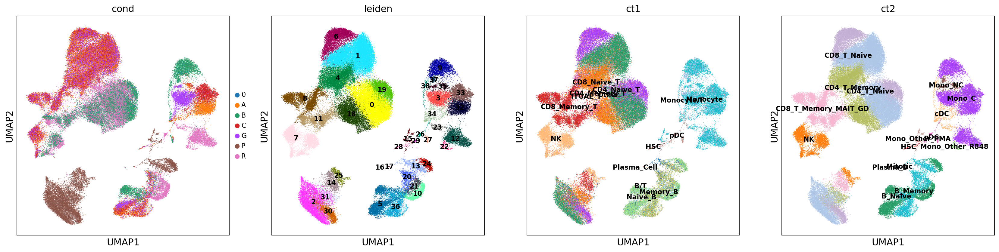

In [5]:
fig, ax = plt.subplots(1, 4, figsize=(26,6))
for color, ax, loc in tqdm(zip(['cond', 'leiden', 'ct1', 'ct2'], ax, ['right margin', 'on data', 'on data', 'on data'])):
    sc.pl.umap(concat,color=color, ax=ax, show=False, return_fig=False, size=2, legend_loc=loc, legend_fontsize=10)

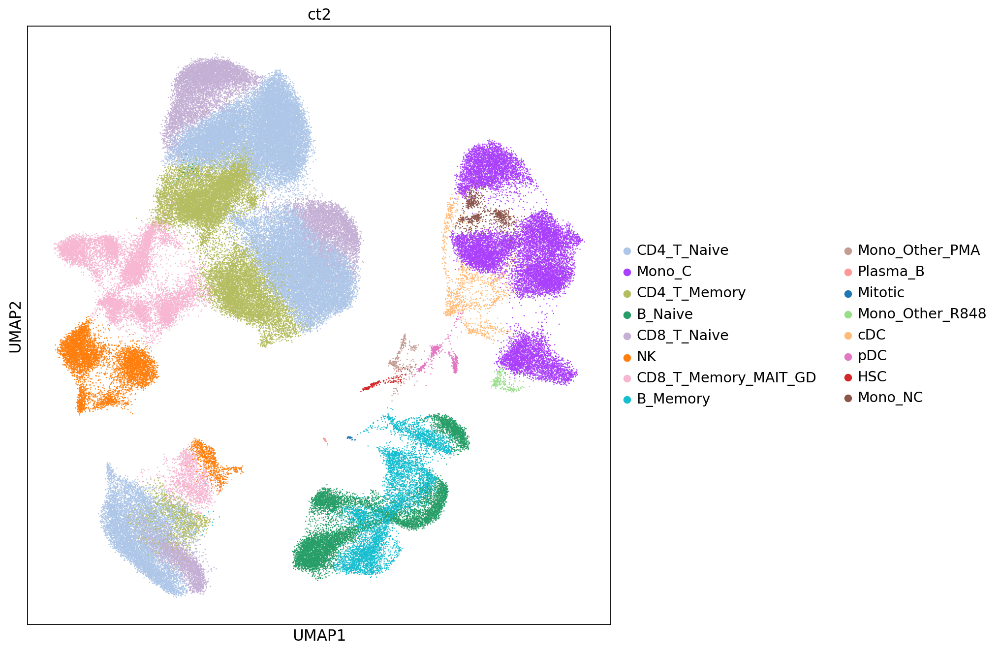

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(9.5,10))
for color, ax in zip(['ct2'], [ax]):
    sc.pl.umap(concat, color=color, ax=ax, show=False, return_fig=False, size=5)

In [8]:
with open(prefix + 'mrna/go.analysis/kmeans.modules/kmeans.n30.main.modules.genes.pkl', 'rb') as file:
    main_modules_genes = pkl.load(file)

In [10]:
for module in tqdm(main_modules_genes.keys()):
    sc.tl.score_genes(concat, main_modules_genes[module], score_name='mod%s_score' % module)

computing score 'mod0_score'
    finished: added
    'mod0_score', score of gene set (adata.obs).
    698 total control genes are used. (0:00:05)
computing score 'mod1_score'
    finished: added
    'mod1_score', score of gene set (adata.obs).
    645 total control genes are used. (0:00:05)
computing score 'mod2_score'
    finished: added
    'mod2_score', score of gene set (adata.obs).
    942 total control genes are used. (0:00:05)
computing score 'mod3_score'
    finished: added
    'mod3_score', score of gene set (adata.obs).
    646 total control genes are used. (0:00:05)
computing score 'mod4_score'
    finished: added
    'mod4_score', score of gene set (adata.obs).
    742 total control genes are used. (0:00:05)
computing score 'mod5_score'
    finished: added
    'mod5_score', score of gene set (adata.obs).
    443 total control genes are used. (0:00:05)
computing score 'mod6_score'
    finished: added
    'mod6_score', score of gene set (adata.obs).
    593 total control gene

In [18]:
len(main_modules_genes)

30

In [29]:
import matplotlib as mpl

In [37]:
cmap = mpl.cm.get_cmap('viridis')
face_color = cmap(0)

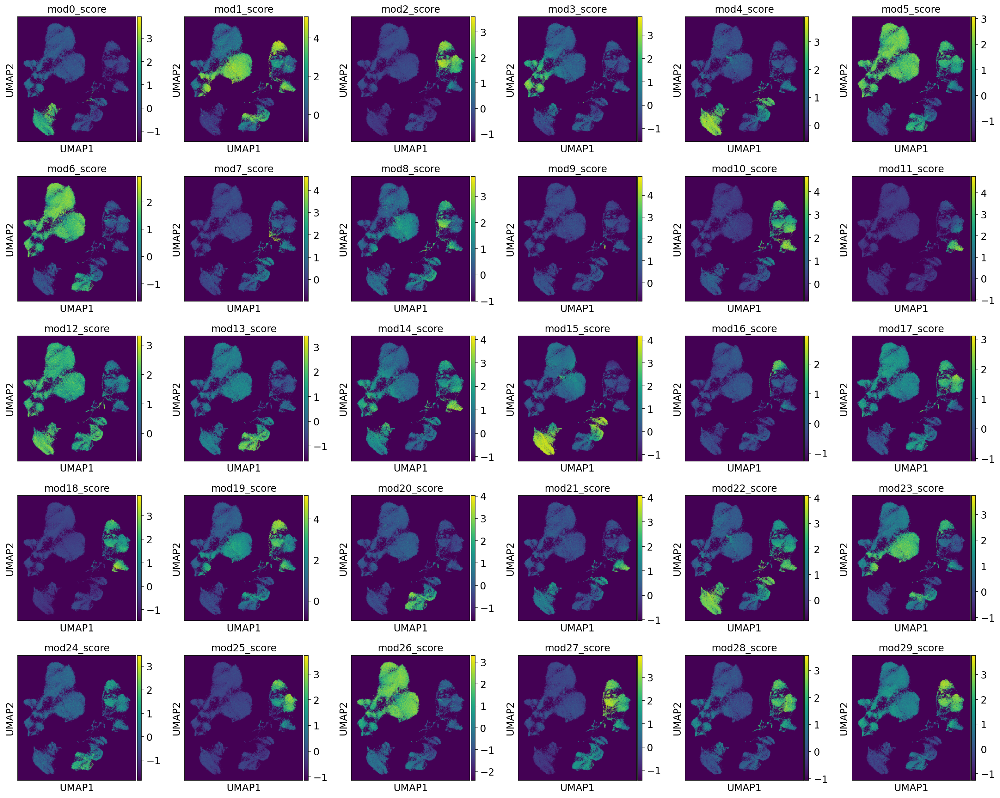

In [38]:
fig, ax = plt.subplots(5,6, figsize=(20,16))
for module, ax in tqdm(zip(main_modules_genes.keys(), np.ravel(ax))):
    ax.set_facecolor(face_color)
    sc.pl.umap(concat, color='mod%s_score' % module, ax=ax, show=False, return_fig=False)
plt.tight_layout()

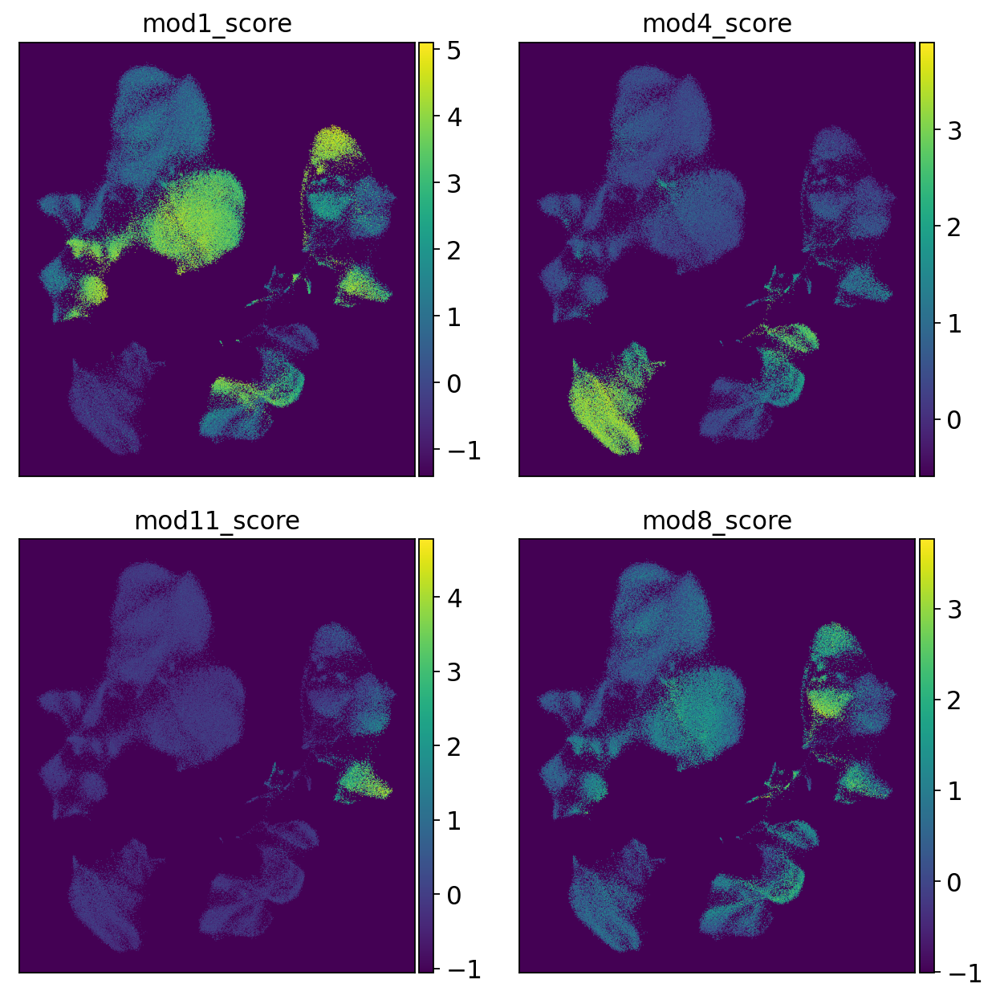

In [51]:
fig, ax = plt.subplots(2,2, figsize=(8,8))
for module, ax in tqdm(zip([1, 4, 11, 8], np.ravel(ax))):
    ax.set_facecolor(face_color)
    sc.pl.umap(concat, color='mod%s_score' % module, ax=ax, show=False, return_fig=False)
    ax.set_ylabel('')
    ax.set_xlabel('')
plt.tight_layout()

In [41]:
main_modules_genes[9]

array(['C12orf45', 'CCL19', 'CLEC4C', 'DNASE1L3', 'ERICH3', 'FXYD6',
       'HERPUD1', 'HIGD1A', 'HSP90B1', 'LILRA4', 'MAP1A', 'MYBL2', 'NEK8',
       'OST4', 'P2RY14', 'PLGRKT', 'PNOC', 'PPIB', 'PTGDS', 'RPS6KA4',
       'SCT', 'SLC15A4', 'SMPD3', 'SSR1', 'TSPAN13', 'UGCG', 'WNT10A'],
      dtype=object)

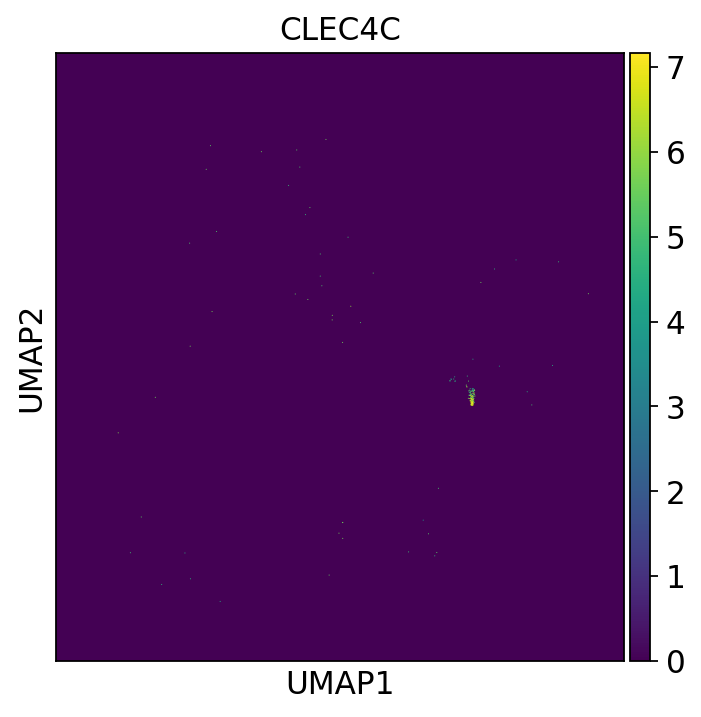

In [45]:
fig, ax = plt.subplots(1,1, figsize=(5,5))
ax.set_facecolor(face_color)
sc.pl.umap(concat, color='CLEC4C', ax=ax, show=False, return_fig=False);